<a href="https://colab.research.google.com/github/thomaskotitsas/my-training/blob/main/Threat_Hunting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [9]:
#εγκατάσταση πακέτου pycaret (https://pycaret.org/)
!pip install pycaret
#εγκατάσταση πακέτου dataprep (https://dataprep.ai/)
!pip install dataprep
#***ΠΡΟΣΟΧΗ*** μετά την εγκατάσταση χρειάζεται restart το session
#***θα σας ζητηθεί επανεκκίνηση με σχετικό κόκκινο μήνυμα μετά την ολοκλήρωση της εγκατάστασης
#***Πατήστε το κουμπί RESTART SESSION στο σχετικό μήνυμα

In [10]:
#εισαγωγή βιβλιοθηκών - πακέτων
import pandas as pd
import matplotlib.pyplot as plt
from pycaret.regression import *
from dataprep.eda import create_report
from pyod.models.iforest import IForest

In [11]:
#εισαγωγή του συνόλου δεδομένων
url = "https://raw.githubusercontent.com/kdemertzis/EKPA/main/Data/DarkNet.csv"
df = pd.read_csv(url)
df.shape

(68580, 83)

In [12]:
#ανακάτεμα των δεδομένων
df = df.sample(frac = 1)

In [13]:
#οπτικοποίηση συνόλου δεδομένων
df.head()

,Src_IP,Src_Port,Dst_IP,Dst_Port,Protocol,Flow_Duration,Total_Fwd_Packet,Total_Bwd_packets,Total_Length_of_Fwd_Packet,Total_Length_of_Bwd_Packet,...,Active_Mean,Active_Std,Active_Max,Active_Min,Idle_Mean,Idle_Std,Idle_Max,Idle_Min,Label-1,Label-2
20586,131.202.242.93,52130,224.0.0.252,5355,17,433779,2,0,44,0,...,0,0,0,0,0,0.00,0,0,NonVPN,Email
65486,131.202.240.242,58312,224.0.0.252,5355,17,410852,2,0,44,0,...,0,0,0,0,0,0.00,0,0,NonVPN,VOIP
14014,10.8.8.178,43734,198.7.63.141,53,17,129536,1,1,34,141,...,0,0,0,0,0,0.00,0,0,VPN,Chat
54531,131.202.240.150,40273,157.55.56.169,40008,17,46537,1,1,43,21,...,0,0,0,0,0,0.00,0,0,NonVPN,Video-Streaming
46388,10.152.152.11,50367,213.80.120.116,6984,6,119992497,4,2,1093,4,...,0,0,0,0,1460000000000000,51544942.73,1456260000000000,1456260000000000,Non-Tor,P2P


ERROR:bokeh.core.validation.check:E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'Total_Length_...ket'


DataPrep Report
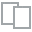
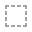
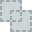
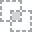
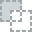
...
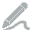
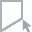
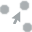
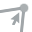
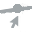

In [14]:
#Διερευνητική ανάλυση δεδομένων (Exploratory Data Analysis - EDA)
create_report(df)

In [15]:

#διαχωρισμός των δεδομένων σε σύνολα εκπαίδευσης (train) και δοκιμών (test)
train_size = int(0.8 * len(df))
train_df = df[:train_size]
test_df = df[train_size:]

In [22]:
#Εκκίνηση της ρύθμισης του PyCaret με προεπεξεργασία δεδομένων
!pip install numpy
import numpy as np # import numpy with np alias
reg_setup = setup(data=df.replace([np.inf, -np.inf], np.nan), target='Flow_Duration', session_id=42,
                  normalize=True, transformation=True)

#σύγκριση των διαθέσιμων μοντέλων ΜΜ
best = compare_models(cross_validation=False, n_select = 1)
%load_ext tensorboard

,Description,Value
0,Session id,42
1,Target,Flow_Duration
2,Target type,Regression
3,Original data shape,"(68580, 83)"
4,Transformed data shape,"(68580, 96)"
5,Transformed train set shape,"(48006, 96)"
6,Transformed test set shape,"(20574, 96)"
7,Numeric features,77
8,Categorical features,5
9,Rows with missing values,0.1%


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
dt,Decision Tree Regressor,693375.9408,8625438534651.0674,2936909.6913,0.9947,0.6365,0.6986,10.6100
rf,Random Forest Regressor,3338744.9677,29795094608394.7773,5458488.3080,0.9818,2.9572,2678.8663,181.9600
gbr,Gradient Boosting Regressor,4495921.5832,40948515625507.2734,6399102.7203,0.9750,3.7795,3912.4239,66.9200
xgboost,Extreme Gradient Boosting,4803355.0003,54911976521841.0312,7410261.5691,0.9665,3.4004,4193.3779,10.5900
ada,AdaBoost Regressor,7093016.3784,59398195541795.0703,7707022.4822,0.9638,5.1614,34855.9827,36.3500
lightgbm,Light Gradient Boosting Machine,5028856.4922,59603287952519.4141,7720316.5707,0.9637,3.5453,4574.5272,11.5000
et,Extra Trees Regressor,5110955.8034,69765507539854.1094,8352574.9048,0.9575,2.7637,1744.9431,94.0800
knn,K Neighbors Regressor,3580109.3784,124108138520158.9219,11140383.2304,0.9244,0.4557,2.5869,6.5100
llar,Lasso Least Angle Regression,11853594.5768,262206455768398.6875,16192790.2404,0.8402,4.9538,49182.7366,7.4500
lr,Linear Regression,11853517.4565,262205335459492.5000,16192755.6475,0.8402,4.9537,49200.5081,9.6300


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

In [23]:
#αναφορά των υπερπαραμέτρων του μοντέλου με την υψηλότερη απόδοση
print(best)

DecisionTreeRegressor(random_state=42)


In [25]:
#μέτρα αξιολόγησης του μοντέλου με την υψηλότερη απόδοση
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [26]:
#δημιουργία μοντέλου ανίχνευσης ανωμαλιών Isolation Forest
iforest = IForest(contamination=0.1)
iforest.fit(train_df[['Flow_Duration']])


IForest(behaviour='old', bootstrap=False, contamination=0.1, max_features=1.0,
    max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
    verbose=0)

In [27]:
#πίνακας προβλέψεων με ανωμαλίες στο σύνολο δοκιμών
test_df['anomaly'] = iforest.predict(test_df[['Flow_Duration']])

In [28]:
#δημιουργία νέας στήλης 'Label' με βάση το αποτέλεσμα του ελέγχου ανίχνευσης ανωμαλιών
test_df['Label'] = test_df['anomaly'].apply(lambda x: 'Anomaly' if x == 1 else 'Normal')

In [30]:
#εκτύπωση των ανωμαλιών
print("Ανωμαλίες στο Test Set:")
print(test_df[test_df['anomaly'] == 1][['Flow_Duration', 'Label']]) # Changed 'flowDuration' to 'Flow_Duration'

Ανωμαλίες στο Test Set:
       Flow_Duration    Label
37136      106874392  Anomaly
1288       115457601  Anomaly
58818       77933939  Anomaly
46584      114939356  Anomaly
34588       44882140  Anomaly
...              ...      ...
58518      114784619  Anomaly
47733       72874648  Anomaly
45509      107456145  Anomaly
55549       45085672  Anomaly
58729       87125116  Anomaly

[1385 rows x 2 columns]


In [31]:
#κατανομή των προβλέψεων για το σύνολο δοκιμών
total_test_samples = len(test_df)
normal_test_samples = len(test_df[test_df['Label'] == 'Normal'])
anomaly_test_samples = len(test_df[test_df['Label'] == 'Anomaly'])

print(f"\nΣύνολο Δοκιμών (Test Set): {total_test_samples}")
print(f"Φυσιολογικές Προβλέψεις: {normal_test_samples}")
print(f"Ανώμαλες Προβλέψεις: {anomaly_test_samples}")
print(f"Ποσοστό Ανωμαλιών: {(anomaly_test_samples / total_test_samples) * 100:.2f}%")


Σύνολο Δοκιμών (Test Set): 13716
Φυσιολογικές Προβλέψεις: 12331
Ανώμαλες Προβλέψεις: 1385
Ποσοστό Ανωμαλιών: 10.10%
